In [114]:
from sklearn.datasets import load_boston
import pandas as pd
import numpy as np
import lime
import lime.lime_tabular
import shap
from sklearn.ensemble import RandomForestRegressor
import re
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data = load_boston()

X = pd.DataFrame(data["data"], columns=data["feature_names"])
y = pd.DataFrame(data["target"], columns=["price"])
data = pd.concat([X, y], axis=1)

In [3]:
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [12]:
# https://gomguard.tistory.com/37
data.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,price
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


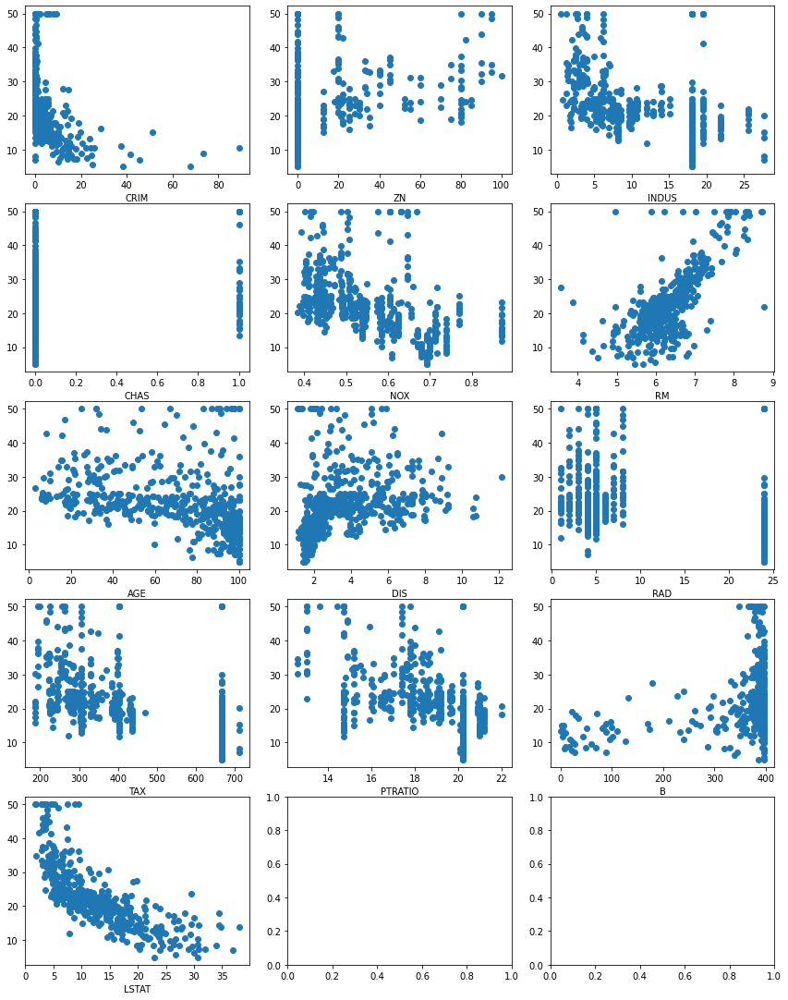

In [44]:
fig, axes = plt.subplots(figsize=(12,15), ncols=3, nrows=int(len(X.columns)/3)+1)
fig.tight_layout()

for col, ax in zip(X.columns, axes.flatten()):
    ax.scatter(data[col], data["price"])
    ax.set_xlabel(col)

# 학습

In [8]:
rf = RandomForestRegressor()
rf.fit(X, y.values.ravel())

RandomForestRegressor()

In [49]:
pd.DataFrame({"col": X.columns, "impo": rf.feature_importances_}).sort_values("impo", ascending=False)

,col,impo
5,RM,0.407760
12,LSTAT,0.396058
7,DIS,0.066076
0,CRIM,0.037192
4,NOX,0.024861
10,PTRATIO,0.017433
9,TAX,0.014079
6,AGE,0.013424
11,B,0.011503
2,INDUS,0.005848


# 변수 중요도가 높은 것 중, RM LSTAT은 전반적으로 선형 관계를 띄기 때문에 XAI를 실험하는 데 의미가 없어 보임.
# DIS를 활용해서 DIS값이 작을 때와 클 때가 정말로 중요도가 다르게 나오는 지 확인
# DIS는 값이 작을 땐 매우 큰 기울기로 price와 큰 양의 관계가 있지만, 값이 커질수록 관련도가 떨어짐

### DIS : 5개의 보스턴 직업센터까지의 접근성 지수

In [50]:
data.sort_values("DIS")

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,price
372,8.26725,0.0,18.10,1.0,0.668,5.875,89.6,1.1296,24.0,666.0,20.2,347.88,8.88,50.0
374,18.49820,0.0,18.10,0.0,0.668,4.138,100.0,1.1370,24.0,666.0,20.2,396.90,37.97,13.8
371,9.23230,0.0,18.10,0.0,0.631,6.216,100.0,1.1691,24.0,666.0,20.2,366.15,9.53,50.0
373,11.10810,0.0,18.10,0.0,0.668,4.906,100.0,1.1742,24.0,666.0,20.2,396.90,34.77,13.8
406,20.71620,0.0,18.10,0.0,0.659,4.138,100.0,1.1781,24.0,666.0,20.2,370.22,23.34,11.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
354,0.04301,80.0,1.91,0.0,0.413,5.663,21.9,10.5857,4.0,334.0,22.0,382.80,8.05,18.2
355,0.10659,80.0,1.91,0.0,0.413,5.936,19.5,10.5857,4.0,334.0,22.0,376.04,5.57,20.6
352,0.07244,60.0,1.69,0.0,0.411,5.884,18.5,10.7103,4.0,411.0,18.3,392.33,7.79,18.6
351,0.07950,60.0,1.69,0.0,0.411,6.579,35.9,10.7103,4.0,411.0,18.3,370.78,5.49,24.1


In [51]:
low_dis_index = [372, 374, 371, 373, 406]
high_dis_index = [354, 355, 352, 351, 353]

In [136]:
# shap랑 비교용
columns = ["real_price", "rf_price", "xai_price", "xai_type"].extend([[f"big{i}_feature", f"big{i}_feature_value", f"big{i}_xai_value"] for i in range(1, 4)])
df_compare = pd.DataFrame(columns=columns)
rgx = re.compile(r"[a-zA-Z]+")

# LIME
explainer = lime.lime_tabular.LimeTabularExplainer(X.values,
                                                   feature_names=X.columns,
                                                   verbose=True,
                                                   mode='regression',
                                                   sample_around_instance=True,
                                                   random_state=42,
                                                   discretizer="decile")
for idx in low_dis_index + high_dis_index:
    # Lime에 데이터 포인트 하나 지정
    e = explainer.explain_instance(X.values[idx], rf.predict)
    # 분류 문제는 predict_proba, 회귀 문제는 predict 사용
    e.show_in_notebook()  # jupyter notebook 환경에서
    
    dict_temp = dict()
    dict_temp["real_price"] = y.iloc[idx].values
    dict_temp["rf_price"] = e.predicted_value
    dict_temp["xai_price"] = e.local_pred
    dict_temp["xai_type"] = "LIME"
    
    lst = e.as_list()
    
    for i in range(1, 4):
        dict_temp[f"big{i}_feature"] = rgx.search(lst[i-1][0]).group()
        dict_temp[f"big{i}_feature_value"] = X.loc[idx, dict_temp[f"big{i}_feature"]]
        dict_temp[f"big{i}_xai_value"] = lst[i-1][1]
    
    df_compare = df_compare.append(pd.DataFrame(dict_temp))

Intercept 23.23430665528081
Prediction_local [26.85314324]
Right: 45.458


Intercept 24.392689814040267
Prediction_local [17.93970254]
Right: 13.370999999999986


Intercept 23.842336561497618
Prediction_local [27.4207028]
Right: 45.246


Intercept 24.161525729083756
Prediction_local [17.8625441]
Right: 13.11699999999998


Intercept 23.874733747966793
Prediction_local [17.93529457]
Right: 12.482999999999997


Intercept 23.53390675101354
Prediction_local [22.21546023]
Right: 19.17300000000001


Intercept 23.591152274052668
Prediction_local [24.02466199]
Right: 21.122999999999976


Intercept 24.282657077748592
Prediction_local [23.53636032]
Right: 19.69599999999998


Intercept 23.085700210286905
Prediction_local [26.35826583]
Right: 24.981999999999974


Intercept 22.65048059587237
Prediction_local [32.24161362]
Right: 30.188999999999954


# LIME과 SHAP가 같은 데이터에 대해서 중요하게 생각하는 변수가 비슷한지 확인

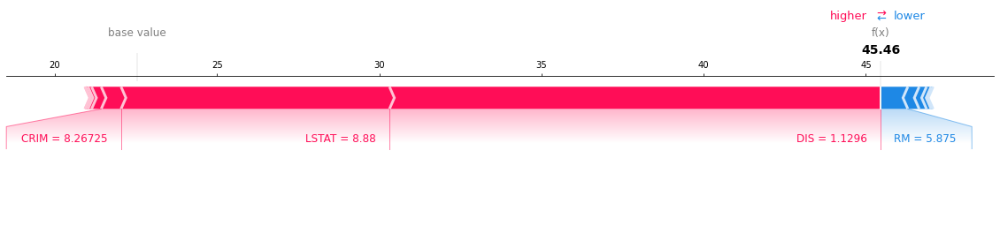

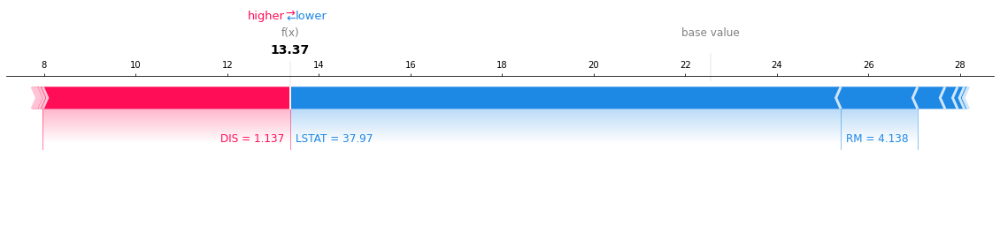

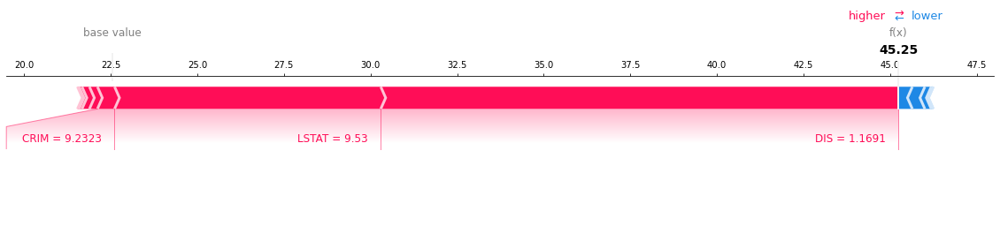

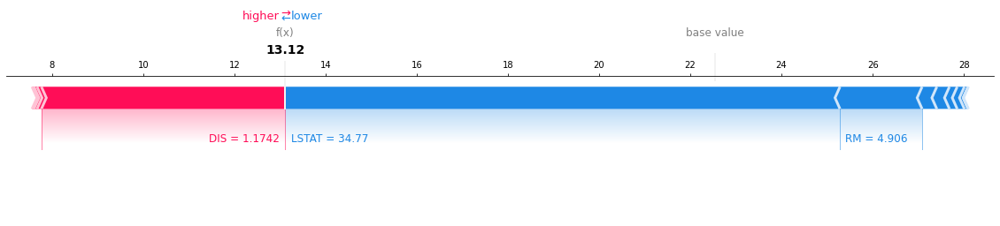

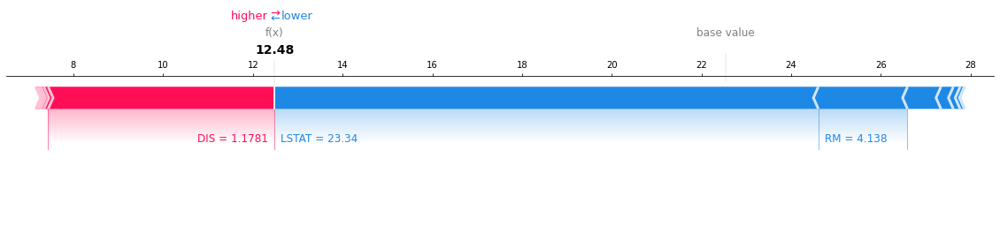

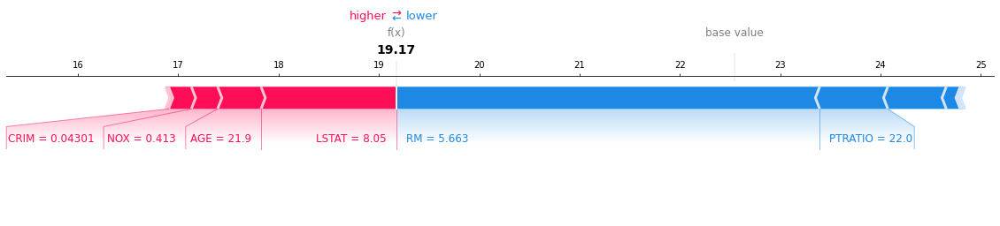

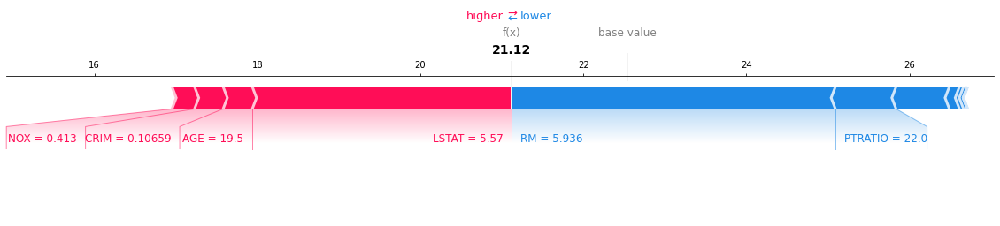

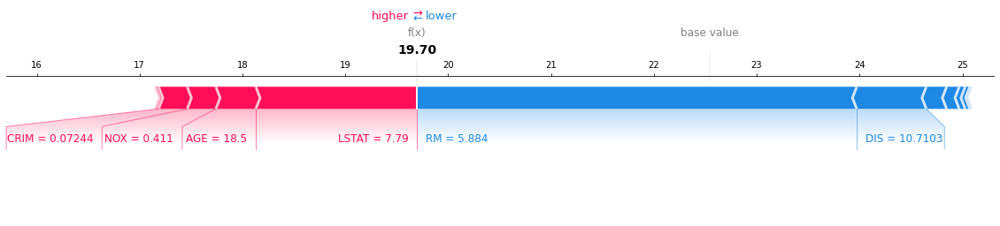

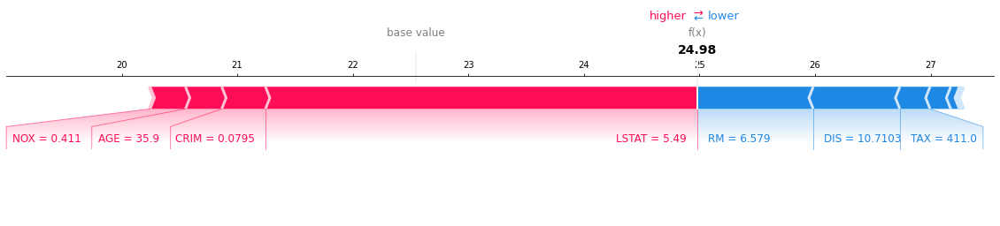

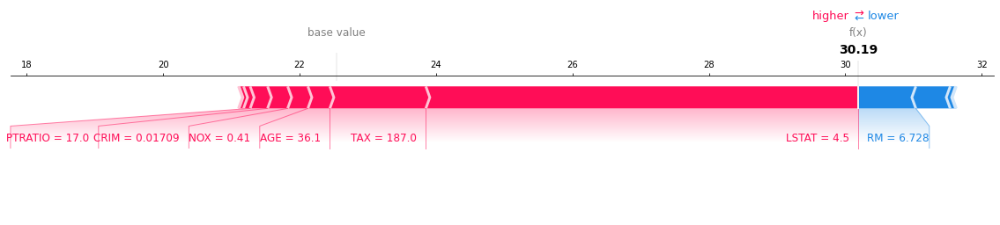

In [158]:
# load JS visualization code to notebook
shap.initjs()

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X)

for idx in low_dis_index + high_dis_index:
    # visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
    shap.force_plot(explainer.expected_value, shap_values[idx,:], X.iloc[idx,:], matplotlib=True)
    
    dict_temp = dict()
    dict_temp["real_price"] = y.iloc[idx].values
    dict_temp["rf_price"] = rf.predict(X.iloc[idx:idx+1, :])
    dict_temp["xai_price"] = rf.predict(X.iloc[idx:idx+1, :])
    dict_temp["xai_type"] = "SHAP"
    
    big3_idx = shap_values[idx, :].argsort()[-1:-4:-1]
    for i in range(1, 4):
        dict_temp[f"big{i}_feature"] = X.columns[big3_idx[i-1]]
        dict_temp[f"big{i}_feature_value"] = X.loc[idx, dict_temp[f"big{i}_feature"]]
        dict_temp[f"big{i}_xai_value"] = shap_values[idx, big3_idx[i-1]]
        
    df_compare = df_compare.append(pd.DataFrame(dict_temp))
    
    

In [161]:
df_compare.sort_values(["real_price", "rf_price", "xai_price"])

,real_price,rf_price,xai_price,xai_type,big1_feature,big1_feature_value,big1_xai_value,big2_feature,big2_feature_value,big2_xai_value,big3_feature,big3_feature_value,big3_xai_value
0,11.9,12.483,12.483000,SHAP,DIS,1.1781,5.047912,NOX,0.6590,0.096355,INDUS,18.10000,0.071367
0,11.9,12.483,17.935295,LIME,LSTAT,23.3400,-5.340927,DIS,1.1781,4.044565,RM,4.13800,-2.598577
0,13.8,13.117,13.117000,SHAP,DIS,1.1742,5.349363,B,396.9000,0.094367,INDUS,18.10000,0.068069
0,13.8,13.117,17.862544,LIME,LSTAT,34.7700,-4.963581,DIS,1.1742,3.763707,RM,4.90600,-2.901654
0,13.8,13.371,13.371000,SHAP,DIS,1.1370,5.405167,B,396.9000,0.074694,INDUS,18.10000,0.066115
0,13.8,13.371,17.939703,LIME,LSTAT,37.9700,-5.031516,DIS,1.1370,3.832754,RM,4.13800,-3.030023
0,18.2,19.173,19.173000,SHAP,LSTAT,8.0500,1.347751,AGE,21.9000,0.432715,NOX,0.41300,0.261842
0,18.2,19.173,22.215460,LIME,RM,5.6630,-2.691154,LSTAT,8.0500,1.866558,DIS,10.58570,-0.972551
0,18.6,19.696,19.696000,SHAP,LSTAT,7.7900,1.566277,AGE,18.5000,0.388454,NOX,0.41100,0.278702
0,18.6,19.696,23.536360,LIME,RM,5.8840,-2.601728,LSTAT,7.7900,1.618193,DIS,10.71030,-0.870822


In [162]:
# LIME과 SHAP이 약간 다름.
# DIS가 클 때와 작을 때의 중요도가 바뀌는 건 같음
# tree_detail도 나중에 해보기